# Imports

In [203]:
import requests
import json
from bs4 import BeautifulSoup
import networkx as nx
import re
from matplotlib import pyplot as plt
import time
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import defaultdict
from infomap import Infomap

# Load statics

In [204]:
# Load stored course-site HTMLs
with open('valid_courses.json') as f:
    valid_courses = json.load(f)

# Load department color mapping
with open('department_colors.json') as f:
    department_colors = json.load(f)

# Load department names
with open('department_names.json') as f:
    department_names = json.load(f)

# Create graph

## Add nodes

In [205]:
# Initialize directd graph
G = nx.DiGraph()

# Go through each course
for course_num in valid_courses:
    department = course_num[:2] 
    G.add_node(course_num,
               course_num=course_num,
               page=valid_courses[course_num],
               department=department, 
               color=department_colors[department],
               department_name=department_names[department])

## Add edges

In [206]:
for course_num in valid_courses:

    ### Initialize BeuatifulSoup object
    page = G.nodes[course_num]['page']
    soup = BeautifulSoup(page, 'html.parser')

    ### Find <tr> that contains "Academic prerequisites"
    search_string = "Academic prerequisites"
    
    # Find respective label
    label = soup.find('label', string=re.compile(search_string))
    if label is None:
        continue
    
    # Get element that contains the label + prerequisites
    parent = label.find_parent().find_parent()
    
    # Get second <td>
    prerequisite = parent.find_all('td')[1].text

    # Remove whitespace and breaks (\n and \r)
    prerequisite  = prerequisite.replace('\r', ' ')
    prerequisite  = prerequisite.replace('\n ', '')

    # Extract 5 digit numbers (any course number)
    prerequisites = set(re.findall(r'\d{5}', prerequisite))
    
    # if course exists in graph, add edge
    for prerequisite in prerequisites:
        if prerequisite in G.nodes:
            if prerequisite == course_num: 
                # Handle self-loops
                pass
            else:
                G.add_edge(prerequisite, course_num)

## Add text attributes

In [207]:
for node in G.nodes:
    
    ### Initialize BeuatifulSoup object
    page = G.nodes[node]['page']
    soup = BeautifulSoup(page, 'html.parser')
    
    ### Add title to node
    title = soup.title.text
    cleaned = ' '.join(title.strip().split())[6:]
    G.nodes[node]['course_title'] = cleaned
    
    ### Add course text to node (General course objectives + Learning objectives + Content)
    div = soup.find('div', string=re.compile("General course objectives")).parent(string=True)
    
    remove_indeces = []
    for d, text in enumerate(div):
        if text in ["General course objectives", "Learning objectives", "Content", "Last updated", "\r\nA student who has met the objectives of the course will be able to:\r\n\r\n"]:
            remove_indeces.append(d)
    
    new_div = [div[i] for i in range(len(div)) if i not in remove_indeces]
    text = ' '.join(new_div[:-1]).replace('\r', ' ').replace('\n', '')
    cleaned = ' '.join(text.strip().split())
    G.nodes[node]['course_text'] = cleaned  
    G.nodes[node]['text_size'] = len(cleaned) 
    G.nodes[node]['word_count'] = len(cleaned.split())

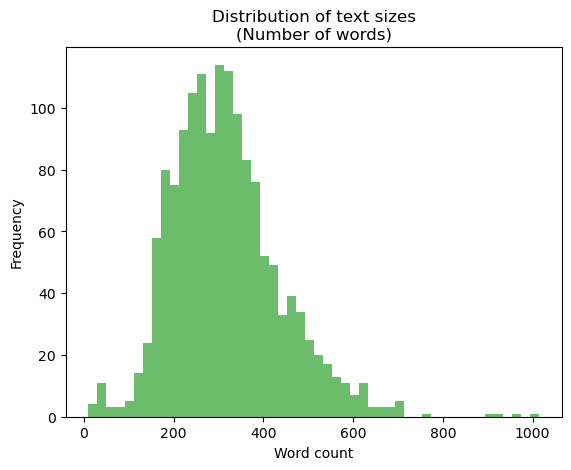

In [208]:
# plot distribution of text sizes
text_sizes = [G.nodes[node]['word_count'] for node in G.nodes]
plt.hist(text_sizes, bins=50, color='C2', alpha=0.7)
plt.title('Distribution of text sizes\n(Number of words)')
plt.xlabel('Word count')
plt.ylabel('Frequency')
plt.show()

# Get evaluations and grades

In [209]:
# Evaluations
with open('eval_scores.json') as f:
    eval_scores = json.load(f)

# Grades
with open('grade_scores.json') as f:
    grade_scores = json.load(f)

In [210]:
# Apply evaluation and grade attributes
for course_num in grade_scores:
    G.nodes[course_num]['eval_scores'] = eval_scores[course_num]
    G.nodes[course_num]['grade_scores'] = grade_scores[course_num]

In [211]:
G.nodes['02805']

{'course_num': '02805',
 'page': '<!DOCTYPE html>\r\n<html>\r\n<head>\r\n    <meta http-equiv="X-UA-Compatible" content="IE=edge" />\r\n    <meta charset="utf-8" />\r\n    <meta name="viewport" content="width=device-width, initial-scale=1.0">\r\n    \r\n    <title>\r\n    02805 Social graphs and interactions \r\n</title>\r\n    <link href="/bundles_css_general?v=mCt0xLH6ZVm097AMT4IZXI_8YhGCBjBIv-CzzPZWduw1" rel="stylesheet"/>\r\n\r\n    <script src="/bundles_js_general?v=m944kgjFG7-r2HFwxi7Q_xDuvGXt8MWkcxYxVH_TSmE1"></script>\r\n\r\n    \r\n\r\n\r\n    <script>\r\n        $(function () {\r\n            $("[data-open-dialog]").on(\'click touchstart\', function () {\r\n                var me = $(this);\r\n                var bs = $("#" + me.data("open-dialog"));\r\n                bs.modal({ show: true, backdrop: true });\r\n            });\r\n        });\r\n\r\n        function getCookie(cname) {\r\n            var name = cname + "=";\r\n            var decodedCookie = decodeURIComponen

# Degree distribution

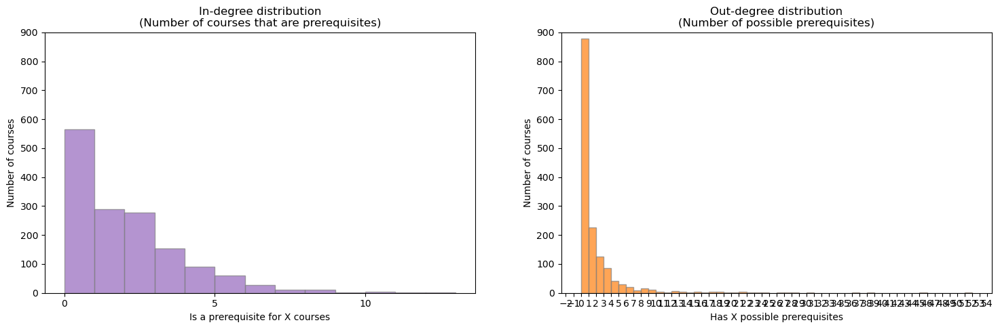

In [ ]:
# Calculate in- and out-degrees. Show histogram
in_degrees = [G.in_degree(n) for n in G.nodes]
out_degrees = [G.out_degree(n) for n in G.nodes]

fig, axs = plt.subplots(1, 2, figsize=(18, 5))
axs[0].set_ylim(0, 900)
axs[0].hist(in_degrees, bins=range(min(in_degrees), max(in_degrees) + 2), color='C4', alpha=0.7, edgecolor='grey', label='In-degree (is a prerequisite)')
axs[0].set_xlabel('Has X possible prerequisites')
axs[0].set_ylabel('Number of courses')
axs[0].set_title('Out-degree distribution\n(Number of possible prerequisites)')
axs[0].xaxis.set_major_locator(plt.MaxNLocator(integer=True))
axs[0].xaxis.set_major_locator(plt.MultipleLocator(1))

axs[1].set_ylim(0, 900)
axs[1].hist(out_degrees, bins=range(min(out_degrees), max(out_degrees) + 2), color='C1', alpha=0.7, edgecolor='grey', label='Out-degree (number of possible prerequisites)')

axs[1].set_xlabel('Is a prerequisite for X courses')
axs[1].set_ylabel('Number of courses')
axs[1].set_title('In-degree distribution\n(Number of courses that are prerequisites)')
axs[1].xaxis.set_major_locator(plt.MaxNLocator(integer=True))
axs[1].xaxis.set_major_locator(plt.MultipleLocator(5))

plt.show()

# Plotting

## Test partitionings

### Louvain
Notes: Basically takes all chunks that are connected, and assign them a partition. This is possible since not all subgraphs are connected. Caveats of this is, that we get huge partitions, if a course is somehow connected to a "hub-course"

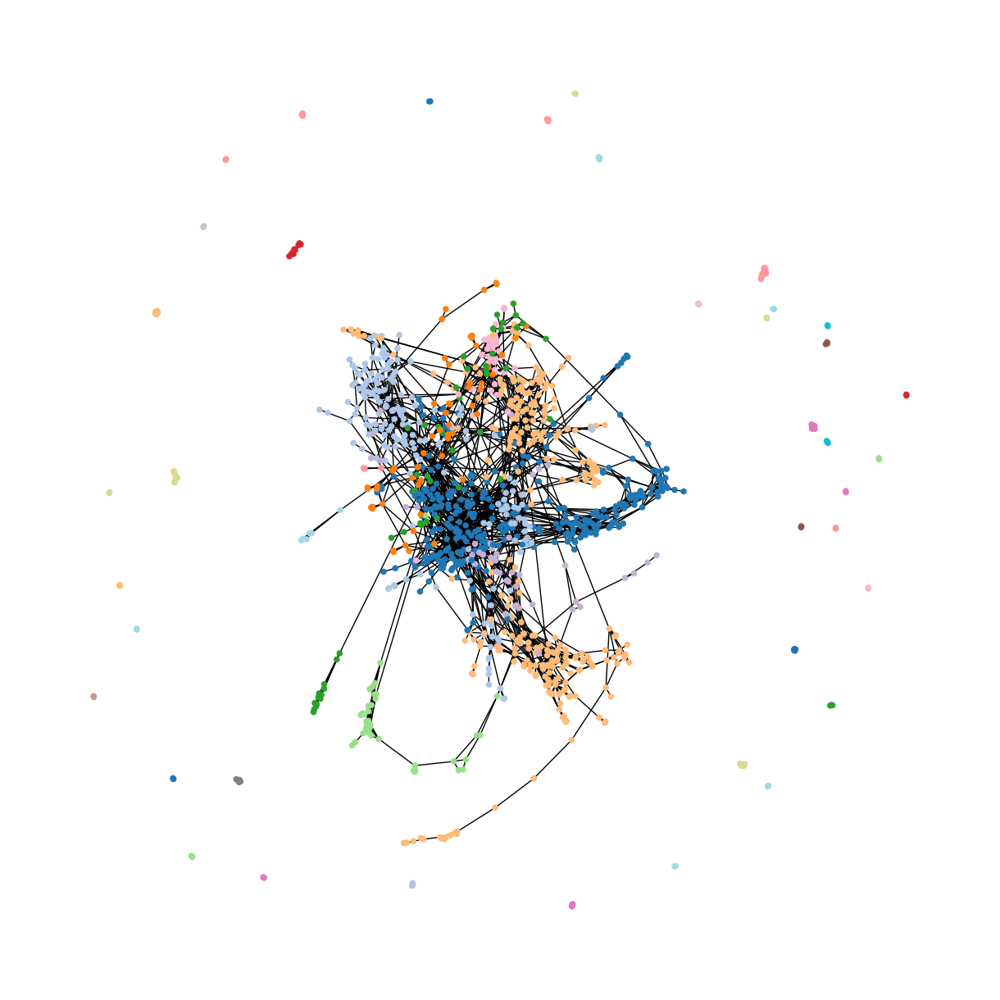

In [213]:
# Louvain communities
from community import community_louvain

H = G.to_undirected()

partition = community_louvain.best_partition(H, random_state=42)

for node in H.nodes:
    H.nodes[node]['community'] = partition[node]
    # nodes with no edges
    if H.degree(node) == 0:
        H.nodes[node]['community'] = 'X'

# remove nodes with community 'X'
H = H.subgraph([n for n in H.nodes if H.nodes[n]['community'] != 'X'])

# Plot graph with communities
pos = nx.forceatlas2_layout(H)
colors = [H.nodes[n]['community'] for n in H.nodes]
plt.figure(figsize=(12,12))
nx.draw(H, pos, node_color=colors, with_labels=False, node_size=20, cmap='tab20')
plt.show()

In [214]:
# create dict with community as key and list of courses as value
communities = defaultdict(list)
for node in H.nodes:
    communities[H.nodes[node]['community']].append(H.nodes[node]['course_title'])

In [215]:
communities.keys()

dict_keys([0, 1, 2, 4, 5, 6, 62, 14, 15, 24, 27, 29, 48, 64, 65, 66, 70, 72, 73, 74, 83, 84, 85, 107, 117, 118, 136, 140, 145, 146, 147, 148, 155, 158, 190, 204, 209, 210, 248, 250, 253, 259, 260, 271, 283, 284, 297, 320, 357, 358, 360, 361, 365, 383, 385, 401, 404, 408, 410, 411, 414])

In [216]:
index = 2
print(len(communities[index]))
communities[index]

36


['Algebraic Error-Correcting Codes',
 'Digital Instrumentation',
 'Introduction to Satellite Systems',
 'Space Systems Engineering',
 'Spacecraft Instrumentation Systems',
 'Image Analysis with Microcomputer',
 'Fundamentals of fibre-optic communication systems',
 'Advanced Optical Communication Systems',
 'Optical Communications Journal Club',
 'Introduction to digital communication',
 'Coding in communication systems',
 'Project Work – Bachelor in Cyber Technology',
 'Digital communication 1',
 'Data Science, Compression and Image Communication',
 'Digital video technology',
 'Machine learning techniques for design and optimization of communication systems',
 'Advanced image and video coding',
 'Advanced forward error correction and iterative decoding',
 'Introduction to Cyber Technology',
 'Introduction to Data Communication Networks',
 'Internet of things – application and infrastructure implementation',
 'Communication Network for Control and Data Acquisition',
 'Modelling and sim

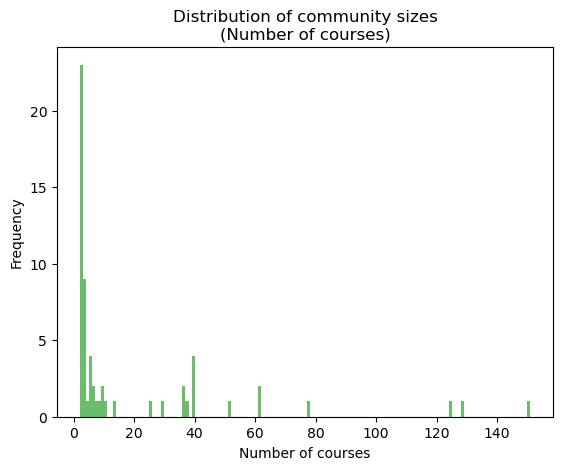

In [217]:
# plot distribution of value sizes
value_sizes = [len(communities[c]) for c in communities]
plt.hist(value_sizes, bins=range(min(value_sizes), max(value_sizes) + 2), color='C2', alpha=0.7)
plt.title('Distribution of community sizes\n(Number of courses)')
plt.xlabel('Number of courses')
plt.ylabel('Frequency')
plt.show()

### Infomap

  Infomap v2.8.0 starts at 2024-11-23 14:40:38
  -> Input network: 
  -> No file output!
  OpenMP 201511 detected with 8 threads...
  -> Ordinary network input, using the Map Equation for first order network flows
Calculating global network flow using flow model 'undirected'... 
  -> Using undirected links.
  => Sum node flow: 1, sum link flow: 1
Build internal network with 1136 nodes and 2360 links...
  -> One-level codelength: 9.59604342

Trial 1/1 starting at 2024-11-23 14:40:38
Two-level compression: 36% 1.8% 0.362143974% 0.120212204% 0.0105180975% 
Partitioned to codelength 1.22978381 + 4.74000537 = 5.969789183 in 110 modules.
Super-level compression: 1.06209422% to codelength 5.906384397 in 46 top modules.

Recursive sub-structure compression: 19.8170744% 0.842852322% 0% . Found 4 levels with codelength 5.844174937

=> Trial 1/1 finished in 0.029295824s with codelength 5.84417494


Summary after 1 trial
Best end modular solution in 4 levels:
Per level number of modules:         [

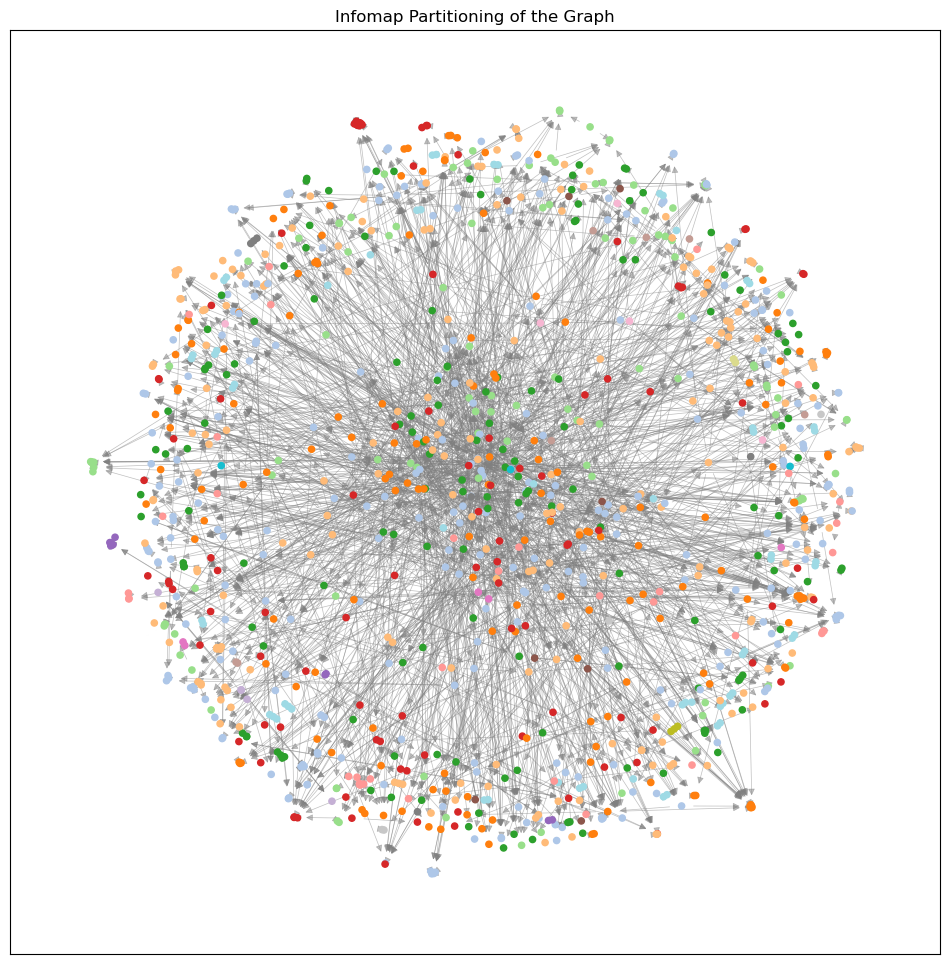

In [232]:
# Initialize Infomap
infomap = Infomap()

H = G.copy()
H = nx.relabel_nodes(H,{n: int(n) for i, n in enumerate(G.nodes)})

# Add edges to Infomap
for edge in H.edges():
    infomap.addLink(int(edge[0]),int(edge[1]))

# Run Infomap algorithm
infomap.run()

# Get the resulting communities
communities = infomap.getModules()

# cmap
cmap = plt.get_cmap('tab20') 

# Draw the graph with the partitioned communitimax(value_sizes) + 2es
colors_infomap = []
T = H.copy()
for node in T.nodes():
    try:
        colors_infomap.append(cmap(communities[int(node)]))
    except KeyError:
        H.remove_node(node)

# Draw the nodes with the partition colors
pos = nx.forceatlas2_layout(H)
plt.figure(figsize=(12,12))
nx.draw_networkx_nodes(H, pos, node_color=colors_infomap, node_size=20)
nx.draw_networkx_edges(H, pos, alpha=0.5, width=0.5, edge_color='grey')

plt.title("Infomap Partitioning of the Graph")
plt.show()

In [233]:
# create dict with community as key and list of courses as value
_communities = defaultdict(list)
for node in H.nodes:
    _communities[communities[node]].append(H.nodes[node]['course_title'])

_communities.keys()

dict_keys([1, 5, 15, 25, 7, 30, 3, 21, 2, 6, 4, 35, 9, 22, 39, 40, 44, 8, 10, 46, 23, 20, 45, 19, 43, 42, 41, 18, 14, 38, 37, 36, 13, 24, 12, 34, 33, 32, 11, 31, 16, 29, 28, 27, 26, 17])

In [253]:
_communities[8]

['Fisheries Engineer I: Describe exploitation and management of fish',
 'Fisheries Engineer II: Comparison of exploitation and management of different fish and shellfish species',
 'Fisheries Engineer III: Improvement of exploitation and management of selected fish and shellfish species',
 'Basic modelling and statistics in R',
 'Preparatory chemistry and physics',
 'Fish Capture Technology II',
 'Fisheries Engineer Project in Greenland I',
 'Entrepreneurship in Greenland',
 'Matematical Methods in Physics']

In [255]:
print(H.nodes[25212])
# get degree of node
for n in H.neighbors(25212):
    print(n, H.nodes[n]['course_title'])

# print out-going edges from node
for edge in H.edges():
    if edge[0] == 25212:
        print(edge)

{'course_num': '25212', 'page': '<!DOCTYPE html>\r\n<html>\r\n<head>\r\n    <meta http-equiv="X-UA-Compatible" content="IE=edge" />\r\n    <meta charset="utf-8" />\r\n    <meta name="viewport" content="width=device-width, initial-scale=1.0">\r\n    \r\n    <title>\r\n    25212 Fisheries Engineer Project in Greenland I \r\n</title>\r\n    <link href="/bundles_css_general?v=mCt0xLH6ZVm097AMT4IZXI_8YhGCBjBIv-CzzPZWduw1" rel="stylesheet"/>\r\n\r\n    <script src="/bundles_js_general?v=m944kgjFG7-r2HFwxi7Q_xDuvGXt8MWkcxYxVH_TSmE1"></script>\r\n\r\n    \r\n\r\n\r\n    <script>\r\n        $(function () {\r\n            $("[data-open-dialog]").on(\'click touchstart\', function () {\r\n                var me = $(this);\r\n                var bs = $("#" + me.data("open-dialog"));\r\n                bs.modal({ show: true, backdrop: true });\r\n            });\r\n        });\r\n\r\n        function getCookie(cname) {\r\n            var name = cname + "=";\r\n            var decodedCookie = decodeU

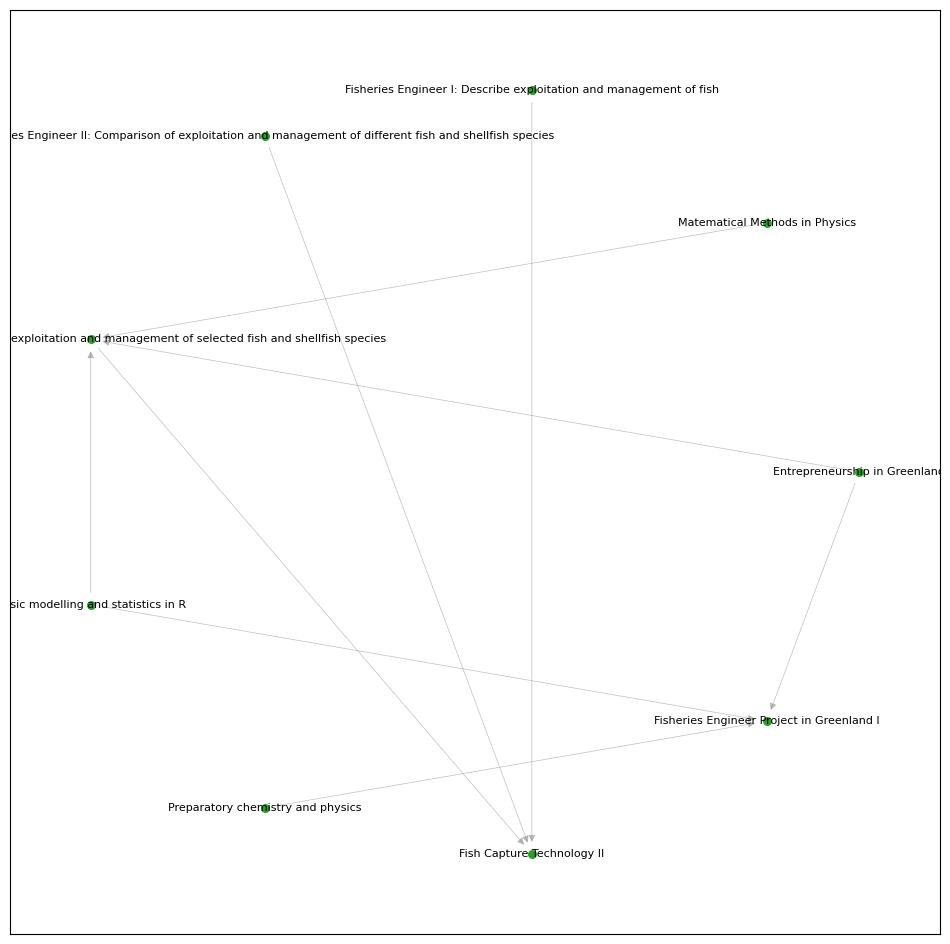

In [258]:
# plot subgraph with community=4
subgraph = H.subgraph([n for n in H.nodes if communities[n] == 8])

pos = nx.circular_layout(subgraph)
plt.figure(figsize=(12,12))
# nx.draw(subgraph, pos, node_color='C2', with_labels=True, node_size=30, edge_color='grey')
nx.draw_networkx_nodes(subgraph, pos, node_color='C2', node_size=30)
nx.draw_networkx_edges(subgraph, pos, alpha=0.5, width=0.5, edge_color='grey')

# label=course_title
nx.draw_networkx_labels(subgraph, pos, labels={n: H.nodes[n]['course_title'] for n in subgraph.nodes}, font_size=8)

plt.show()

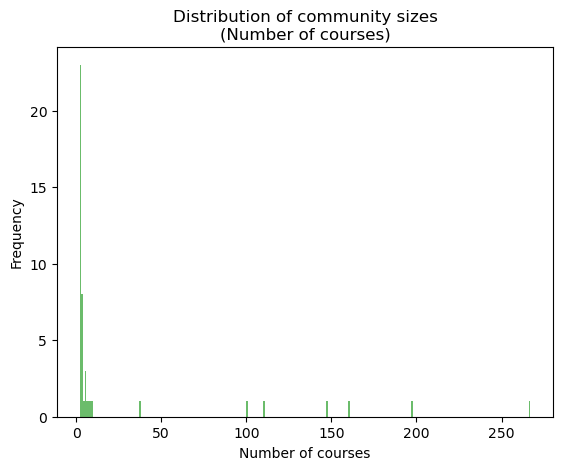

In [223]:
# plot distribution of value sizes
value_sizes = [len(_communities[c]) for c in _communities]
plt.hist(value_sizes, bins=range(min(value_sizes), max(value_sizes) + 2), color='C2', alpha=0.7)
plt.title('Distribution of community sizes\n(Number of courses)')
plt.xlabel('Number of courses')
plt.ylabel('Frequency')
plt.show()

### Label propagation (overlapping communities)

In [224]:
# Label propagation for overlapping communities
from networkx.algorithms.community import label_propagation_communities

H = G.to_undirected()

communities = label_propagation_communities(H)
_communities = defaultdict(list)
for i, community in enumerate(communities):
    for node in community:
        _communities[i].append(H.nodes[node]['course_title'])

_communities.keys()


dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

In [225]:
_communities[11]

['Algorithms and Data Structures 1',
 'Programming projects for Cyber Technology',
 'Process-oriented and Event-driven Software Systems',
 'Software Technology Project',
 'Software Engineering 1',
 'Distributed Real-Time Systems',
 'Transport Optimization',
 'Introduction to Coordination in Distributed Applications',
 'Software Engineering 2']

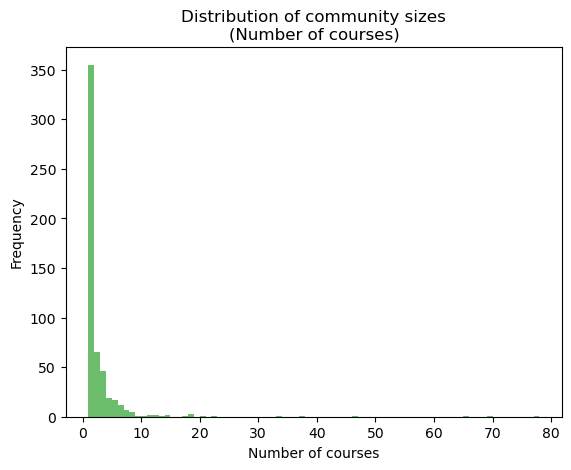

In [226]:
# plot distribution of value sizes
value_sizes = [len(_communities[c]) for c in _communities]
plt.hist(value_sizes, bins=range(min(value_sizes), max(value_sizes) + 2), color='C2', alpha=0.7)
plt.title('Distribution of community sizes\n(Number of courses)')
plt.xlabel('Number of courses')
plt.ylabel('Frequency')
plt.show()

## Other plotting

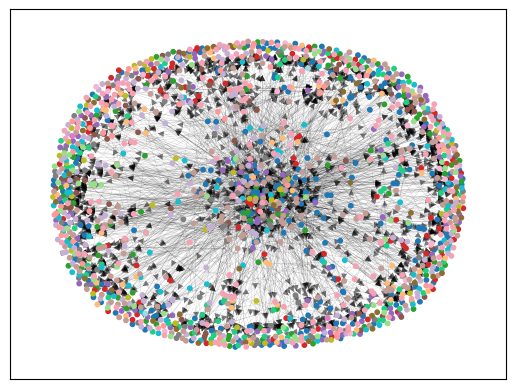

In [227]:
# Draw graph. Set color of nodes based on department
pos = nx.spring_layout(G)
nx.draw_networkx_edges(G, pos, edgelist=G.edges, arrows=True, width=0.1, alpha=0.5)
nx.draw_networkx_nodes(G, pos, node_size=10, node_color=[G.nodes[n]['color'] for n in G.nodes])
plt.show()

/home/mp/anaconda3/envs/viz/lib/python3.10/site-packages/networkx/drawing/nx_pylab.py:457: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


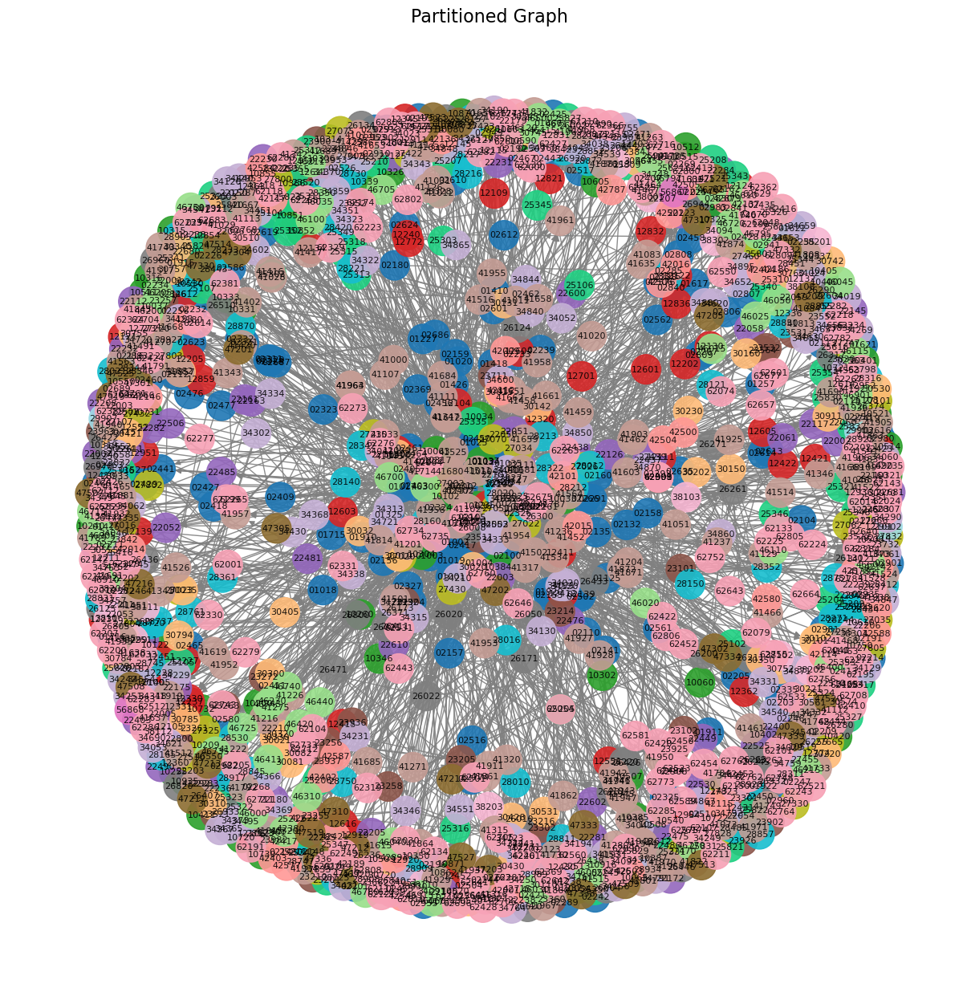

In [228]:
import matplotlib.pyplot as plt
import networkx as nx

def draw_partitioned_graph(G, partition_attribute='color'):
    """
    Draw a graph with nodes colored according to a partition attribute.
    
    Parameters:
    - G: A NetworkX graph (DiGraph or Graph).
    - partition_attribute: Node attribute used for partitioning (e.g., 'color').
    """
    # Extract partition groups
    partition_colors = nx.get_node_attributes(G, partition_attribute)
    
    # Generate a list of colors corresponding to each node
    node_colors = [partition_colors[node] for node in G.nodes()]
    
    # Generate positions using a spring layout
    pos = nx.spring_layout(G, seed=42)  # You can experiment with layouts

    plt.figure(figsize=(12, 12))
    # Draw the graph
    nx.draw(
        G,
        pos,
        with_labels=True,
        node_size=700,
        node_color=node_colors,
        cmap=plt.cm.tab20,  # Colormap for partitions
        arrows=True,        # Indicate edges for DiGraph
        font_size=8,
        font_color='black',
        edge_color='gray',
        alpha=0.9
    )

    plt.title("Partitioned Graph", fontsize=16)
    plt.show()


# Example usage with your graph
draw_partitioned_graph(G, partition_attribute='color')


In [229]:
def draw_partitioned_graph_circular(G, partition_attribute='color'):
    # Extract partition groups
    partition_colors = nx.get_node_attributes(G, partition_attribute)
    
    # List of partitions
    partitions = set(partition_colors.values())
    
    # Assign circular layout for each partition
    pos = {}
    for i, partition in enumerate(partitions):
        nodes_in_partition = [node for node, color in partition_colors.items() if color == partition]
        partition_pos = nx.spring_layout(G, seed=42, k=0.5)
        # Offset the nodes by partition index to avoid overlap
        for node, (x, y) in partition_pos.items():
            pos[node] = (x + i * 2, y)  # Spread out partitions along the x-axis
    
    # Draw the graph
    nx.draw(
        G,
        pos,
        with_labels=False,
        node_size=50,
        node_color=[partition_colors[node] for node in G.nodes()],
        cmap=plt.cm.tab20,  # Colormap for partitions
        font_size=8,
        font_color='black',
        edge_color='gray',
        alpha=0.9
    )
    
    plt.title("Circular Layout by Partition", fontsize=16)
    plt.show()

# Draw using circular layout for partitions
draw_partitioned_graph_circular(G, partition_attribute='color')


KeyboardInterrupt: 

# Analyse words in departments

Purpose:

We want to look at the common words/wordclouds for each partition. 

### Get stopwords

In [ ]:
# Download stopwords if you haven't already
nltk.download('stopwords')

# Get the list of English stopwords from nltk
nltk_stopwords = set(stopwords.words("english"))

# Define your own custom stopwords
with open("stopwords.txt", "r") as file:
    custom_stopwords = {line.strip() for line in file}

# Combine nltk stopwords with your custom stopwords
stop_words = nltk_stopwords.union(custom_stopwords)

# Define a function to remove stopwords from text
def remove_stopwords(text):
    return ' '.join(word for word in text.split() if word.lower() not in stop_words)


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\stein\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


### TF-IDF

In [ ]:
def clean_text(text):
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Keep only letters and spaces
    words = text.lower().split()
    # Remove stopwords
    cleaned_words = [word for word in words if word not in stop_words]
    return cleaned_words

# Populate color partitions with lists of words in each course description
color_partitions = defaultdict(list)
for node, data in G.nodes(data=True):
    color = data.get("color")  
    text = data.get("course_text")  
    
    if color and text:
        # Clean the course text and split into words
        cleaned_words = clean_text(text)
        color_partitions[color].append(cleaned_words)

# Map colors to department names using department_colors and department_names dictionaries
color_to_department = {}
for dept_code, color in department_colors.items():
    color_to_department[color] = department_names.get(dept_code, "Unknown Department")

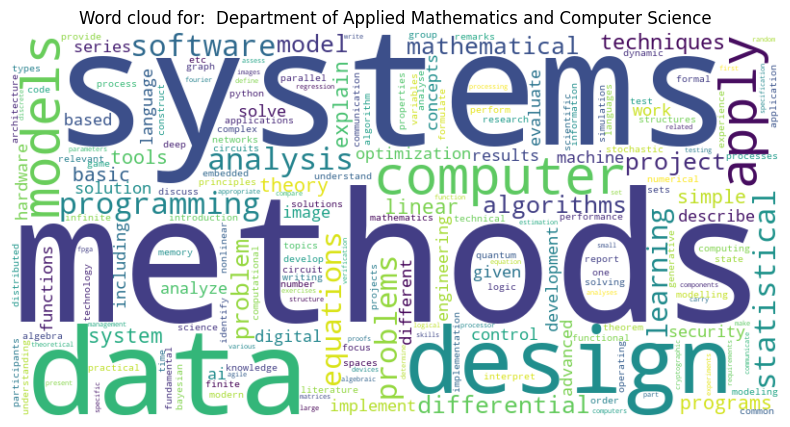

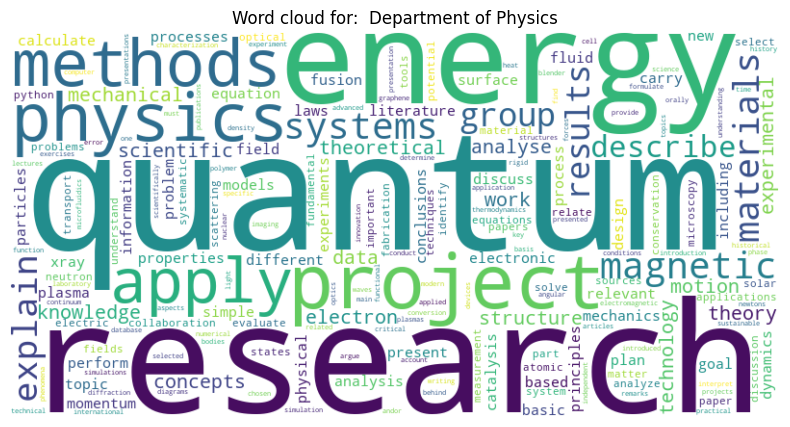

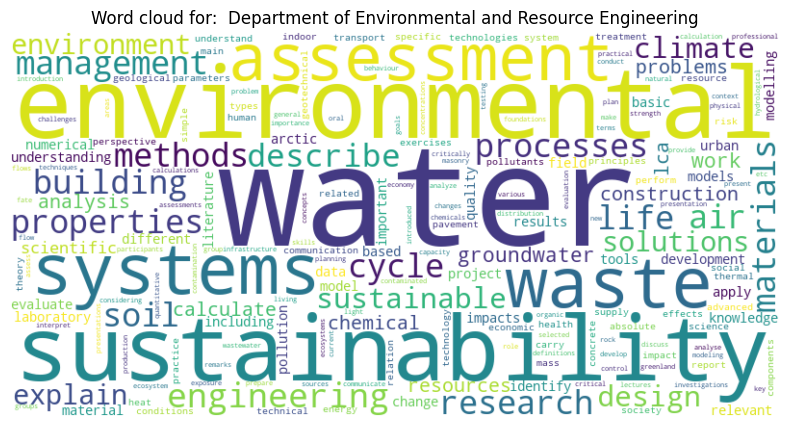

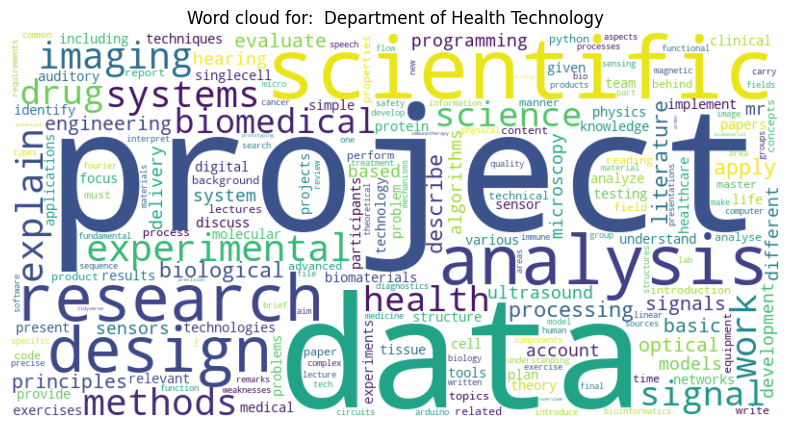

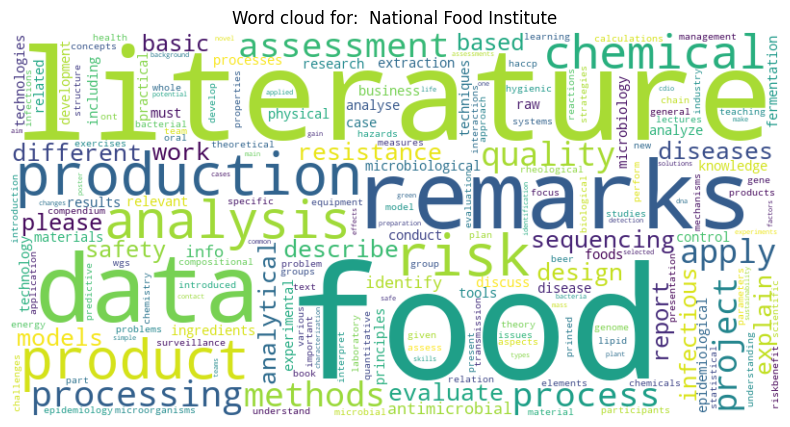

...

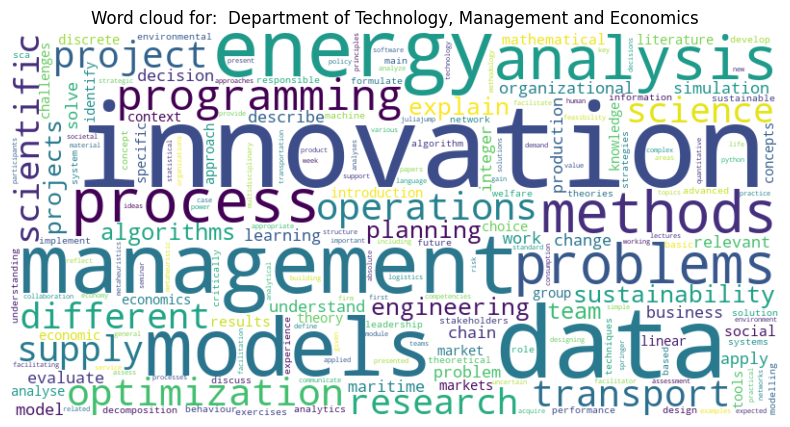

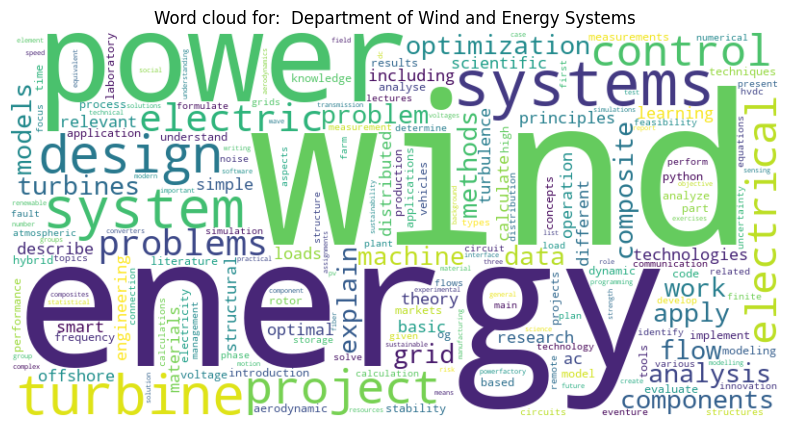

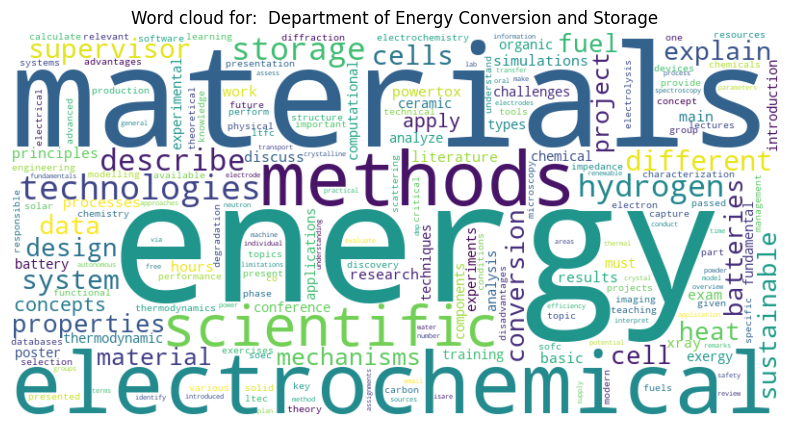

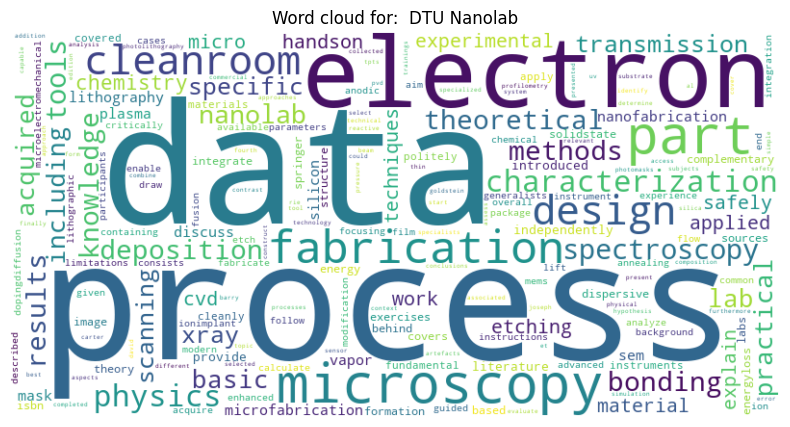

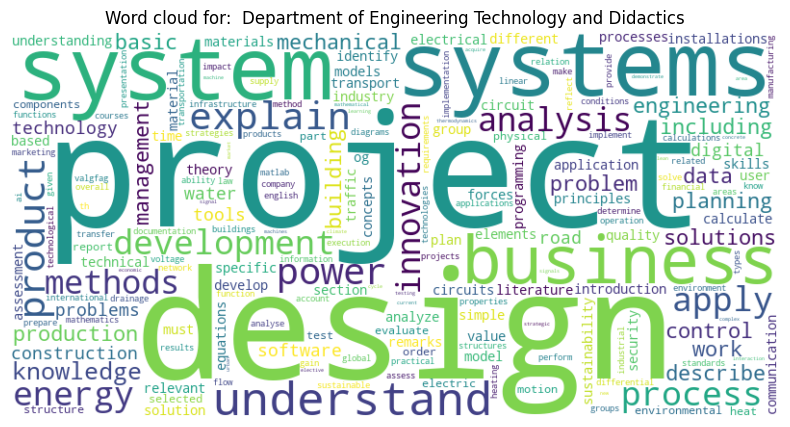

In [ ]:

# Generate word clouds for each color partition (in this case; department)
for color, documents in color_partitions.items():
    # Flatten list of lists into a single list of words for TF-IDF
    documents_flat = [' '.join(doc) for doc in documents]
    documents_flat = [doc for doc in documents_flat if doc]  # Remove empty documents

    # Calculate TF-IDF for the partition's documents using TfidfVectorizer
    vectorizer = TfidfVectorizer()
    tfidf_matrix = vectorizer.fit_transform(documents_flat)
    feature_names = vectorizer.get_feature_names_out()

    tfidf_scores = tfidf_matrix.sum(axis=0).A1  # Sum TF-IDF scores across all documents
    
    # Create a dictionary of terms and their aggregated TF-IDF scores
    aggregated_scores = dict(zip(feature_names, tfidf_scores))
    
    # Filter out terms with zero scores
    aggregated_scores = {term: score for term, score in aggregated_scores.items() if score > 0}

    # Generate the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(aggregated_scores)
    
    # Get department name for this color
    department_name = color_to_department.get(color, "Unknown Department")
    
    # Display the word cloud
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word cloud for:  {department_name}")
    plt.show()